# Grid search sanity check
Stefan/Yuzhao Heng
Since Sun. Dec. 5th, 2021

As humans, from the HSR's laser readings, we have an idea of where KUKA is.
Intuitively, the actual pose of KUKA's shape, relative to HSR's laser scan,
    should have some notion of fitness/closeness.


As a sanity check, we systematically search through possible pose configurations via grid search.
Taking inspiration from ICP, we define loss, given a target and source point clouds,
    as the distance between matched points


## Setup



In [1]:
import os

from icecream import ic

from scripts.data_path import *
from scripts.util import *
from scripts.robo_pose_estimator import *


rcParams["figure.dpi"] = 300
rcParams['font.size'] = 6

pts_hsr = eg_hsr_scan()
pcr_kuka = get_kuka_pointcloud()
tsf_ideal = tsl_n_angle2tsf(config('heuristics.pose_guess.actual_pose'))
lbs = config('heuristics.cluster_labels.good')



## Check implementation correct



2021-12-06 00:16:38| Grid-searching for pose estimates on ... 
    target of [963] points, and 
    source of [240] points ... 
    x range (-4, 9), at precision 1 => 14 candidates and 
    y range (-3, 11), at precision 1 => 15 candidates and 
    angle range (0, 1), at precision 0.5 => 2 candidates, 
    for a combined [420] candidate setups... 
2021-12-06 00:16:39| ... completed


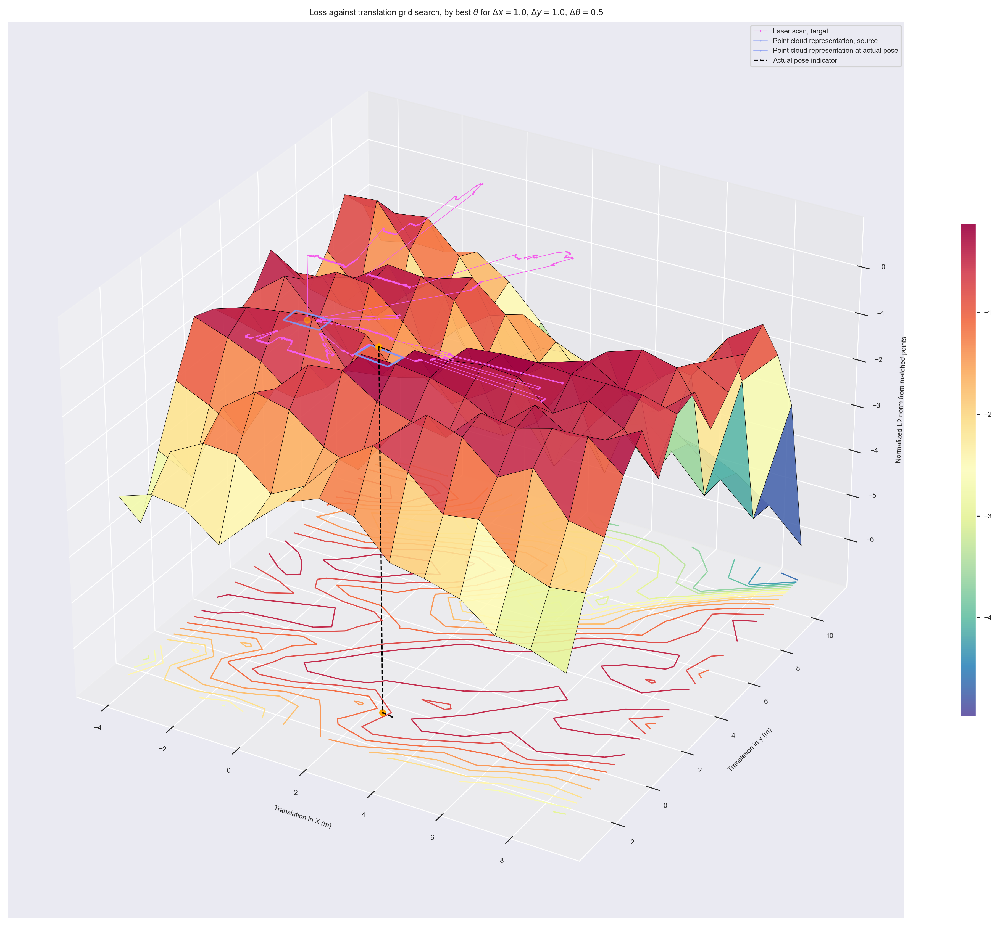

In [3]:
ret = Search.grid_search(
    (pcr_kuka, pts_hsr),
    grid=dict(precision=dict(tsl=1, angle=1/2), range=dict(angle=(0, 1)))
)
plot_grid_search(
    pcr_kuka, pts_hsr, *ret,
    inverse_loss=True,
    tsf_ideal=tsf_ideal,
    zlabel='Normalized L2 norm from matched points',
    interp=False,
)


## Run
A configuration that includes the actual KUKA pose observed
Many translations seem to have a low loss => Doesn't align with our intuition



2021-12-06 00:17:26| Grid-searching for pose estimates on ... 
    target of [963] points, and 
    source of [240] points ... 
    x range (-4, 9), at precision 0.25 => 53 candidates and 
    y range (-3, 11), at precision 0.25 => 57 candidates and 
    angle range (0, 1), at precision 0.05 => 20 candidates, 
    for a combined [60420] candidate setups... 
2021-12-06 00:18:48| ... completed


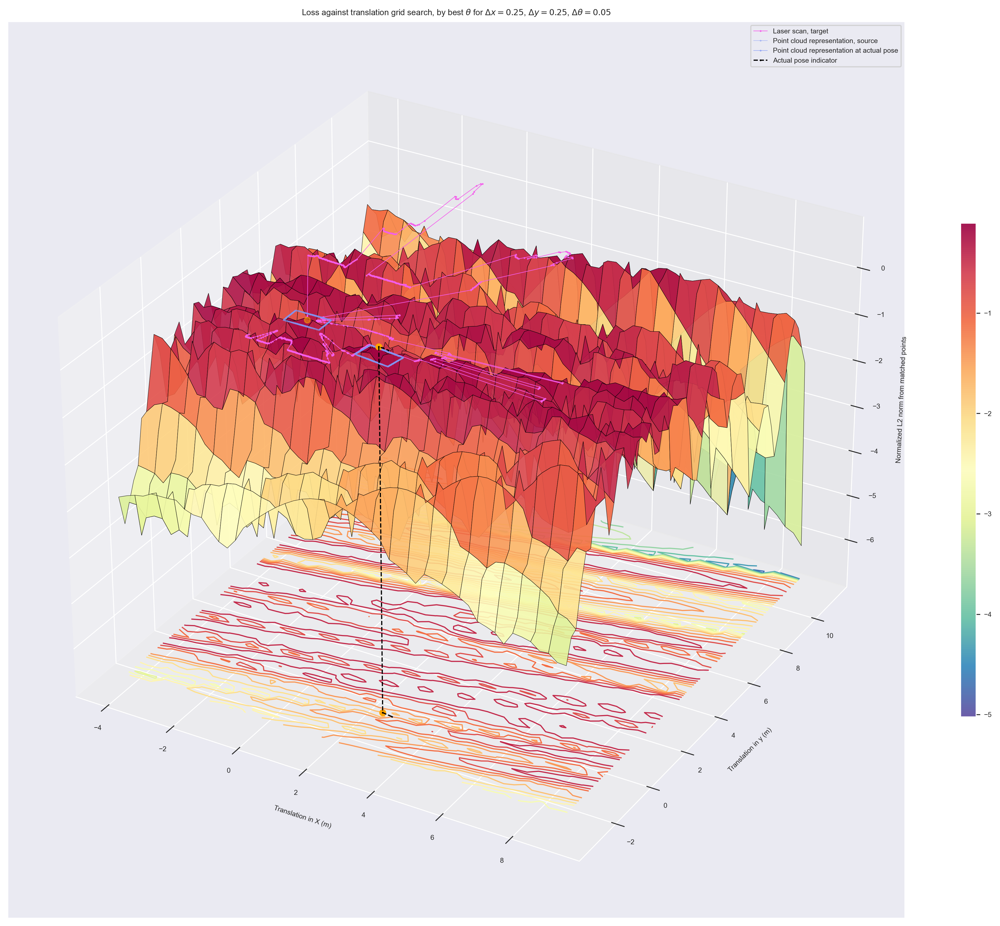

In [4]:
ret = Search.grid_search(
    (pcr_kuka, pts_hsr),
    grid=dict(precision=dict(tsl=0.25, angle=1/20), range=dict(angle=(0, 1)))
)
plot_grid_search(
    pcr_kuka, pts_hsr, *ret,
    inverse_loss=True,
    tsf_ideal=tsf_ideal,
    zlabel='Normalized L2 norm from matched points',
    interp=False,
)


## Cluster first?
Given a good clustering result, and reversing the source and target clouds, and with good initial guess,
    ICP can get a good pose estimate
So we similarly try restricting loss by each cluster

Picked a cluster result known to contain a cluster indicative of the actual KUKA pose


At least the actual pose has a pretty good loss



2021-12-06 00:19:48| Grid-searching for pose estimates on ... 
    target of [240] points, and 
    source of [963] points ... 
    x range (-5, 5), at precision 0.25 => 41 candidates and 
    y range (-5, 5), at precision 0.25 => 41 candidates and 
    angle range (0, 1), at precision 0.05 => 20 candidates, 
    for a combined [33620] candidate setups... 
2021-12-06 00:19:48| Getting errors for cluster #1... 
2021-12-06 00:20:24| Getting errors for cluster #2... 
2021-12-06 00:20:38| Getting errors for cluster #3... 
2021-12-06 00:20:53| Getting errors for cluster #4... 
2021-12-06 00:21:22| Getting errors for cluster #5... 
2021-12-06 00:22:06| Getting errors for cluster #6... 
2021-12-06 00:22:24| Getting errors for cluster #7... 
2021-12-06 00:22:44| Getting errors for cluster #8... 
2021-12-06 00:23:01| Getting errors for cluster #9... 
2021-12-06 00:23:21| Getting errors for cluster #10... 
2021-12-06 00:23:51| Getting errors for cluster #11... 
2021-12-06 00:24:04| Getting error

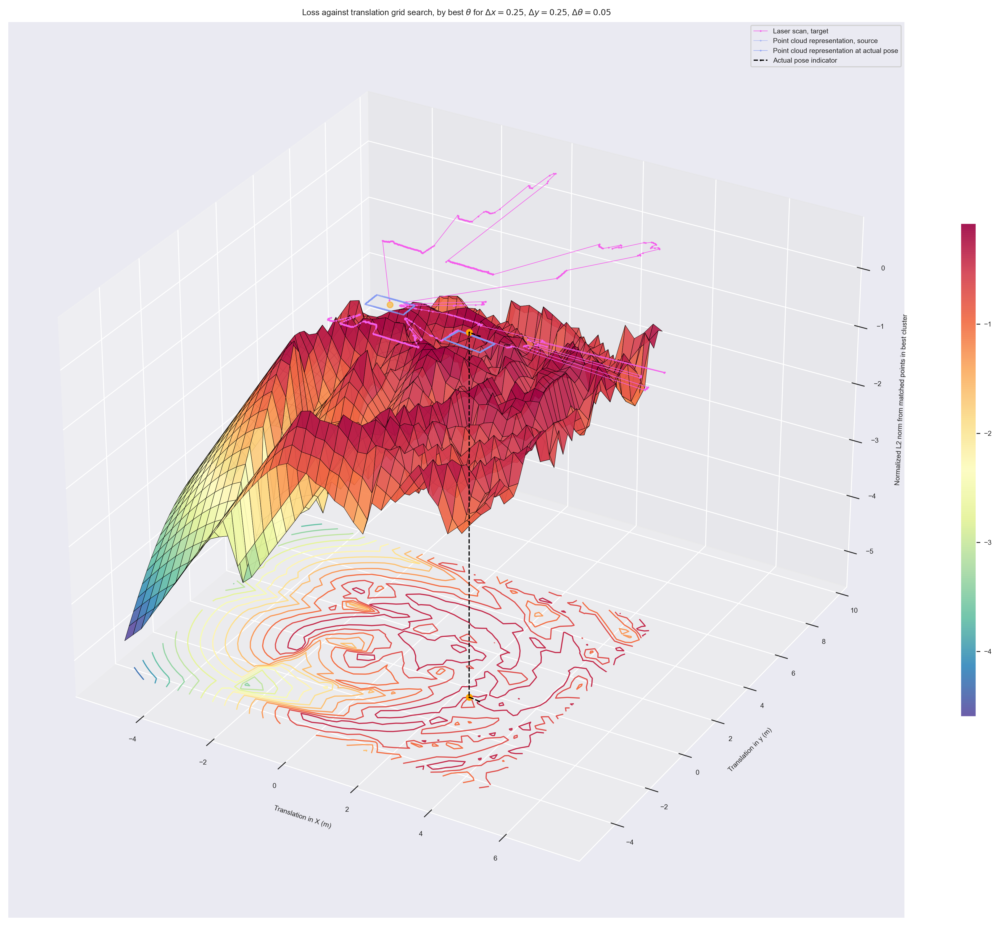

In [5]:
# lbs = Cluster.cluster(pts_hsr, approach='hierarchical', distance_threshold=1)

ret = Search.grid_search(
    (pcr_kuka, pts_hsr),
    reverse=True,
    # save=True,
    grid=dict(precision=dict(tsl=0.25, angle=1/20), range=dict(x=(-5, 5), y=(-5, 5), angle=(0, 1))),
    err_kwargs=dict(labels=lbs, bias=True, n=2)
)
plot_grid_search(
    pts_hsr, pcr_kuka, *ret,
    inverse_loss=True,
    inverse_pts=True,
    labels=lbs,
    interp=False,
    save=True,
    tsf_ideal=tsf_ideal,
    zlabel='Normalized L2 norm from matched points in best cluster'
)



## Why the outliers?
Still, there are many translations that produce a good loss, investigate why



ic| label_idxs: {0: 0,
                 1: 1,
                 2: 2,
                 3: 3,
                 4: 4,
                 5: 5,
                 6: 6,
                 7: 7,
                 8: 8,
                 9: 9,
                 10: 10,
                 11: 11,
                 12: 12,
                 13: 13,
                 14: 14}
ic| opns.shape: (33620, 3), errs.shape: (33620, 15)
ic| idxs_sort.shape: (33620,)
    idxs_sort[:20]: array([ 7726, 21526, 15653, 14471,  9104, 19295, 16474, 17352, 15079,
                           14832, 15306, 21061, 15908, 17300, 14011, 15111, 10292,  7708,
                           12766, 19837])
ic| e: ({0: 0,
         1: 1,
         2: 2,
         3: 3,
         4: 4,
         5: 5,
         6: 6,
         7: 7,
         8: 8,
         9: 9,
         10: 10,
         11: 11,
         12: 12,
         13: 13,
         14: 14},
        array([1.46004251e+00, 8.37905596e+00, 3.26123867e+00, 4.24551776e+00,
              2.17711008e+

2021-12-06 18:38:44| Getting errors for cluster #1... 
2021-12-06 18:38:44| Getting errors for cluster #2... 
2021-12-06 18:38:44| Getting errors for cluster #3... 
2021-12-06 18:38:44| Getting errors for cluster #4... 
2021-12-06 18:38:44| Getting errors for cluster #5... 
2021-12-06 18:38:44| Getting errors for cluster #6... 
2021-12-06 18:38:44| Getting errors for cluster #7... 
2021-12-06 18:38:44| Getting errors for cluster #8... 
2021-12-06 18:38:44| Getting errors for cluster #9... 
2021-12-06 18:38:44| Getting errors for cluster #10... 
2021-12-06 18:38:44| Getting errors for cluster #11... 
2021-12-06 18:38:44| Getting errors for cluster #12... 
2021-12-06 18:38:44| Getting errors for cluster #13... 
2021-12-06 18:38:44| Getting errors for cluster #14... 
2021-12-06 18:38:44| Getting errors for cluster #15... 


ic| tsf_: array([[ 0.93937271, -0.34289781, -2.75380977],
                 [ 0.34289781,  0.93937271, -0.74940672],
                 [ 0.        ,  0.        ,  1.        ]])
    tsl: array([-2.75380977, -0.74940672])
    degrees(theta): 20.053522829578817


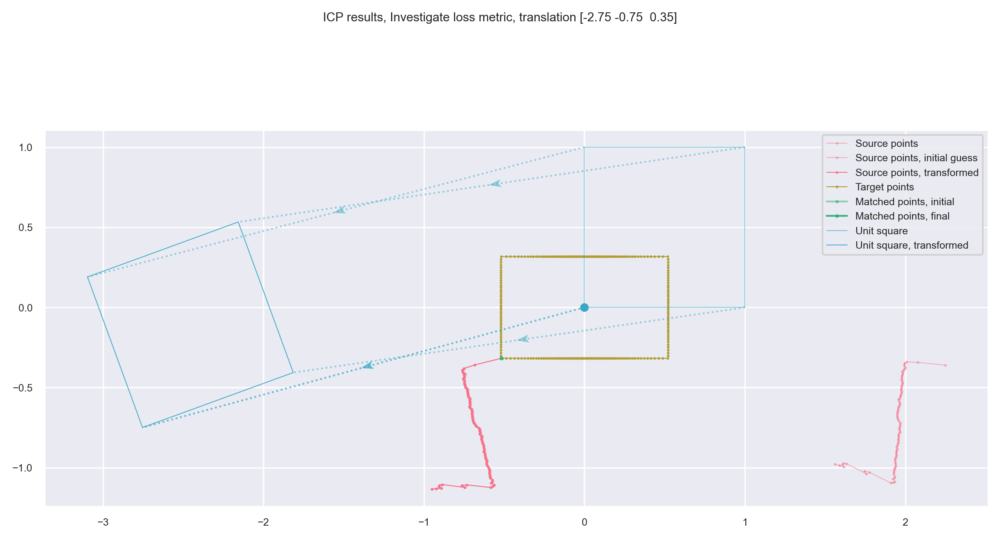

ic| tsf_: array([[ 0.93937271, -0.34289781, -2.75      ],
                 [ 0.34289781,  0.93937271, -0.75      ],
                 [ 0.        ,  0.        ,  1.        ]])
    tsl: array([-2.75, -0.75])
    degrees(theta): 20.053522829578817


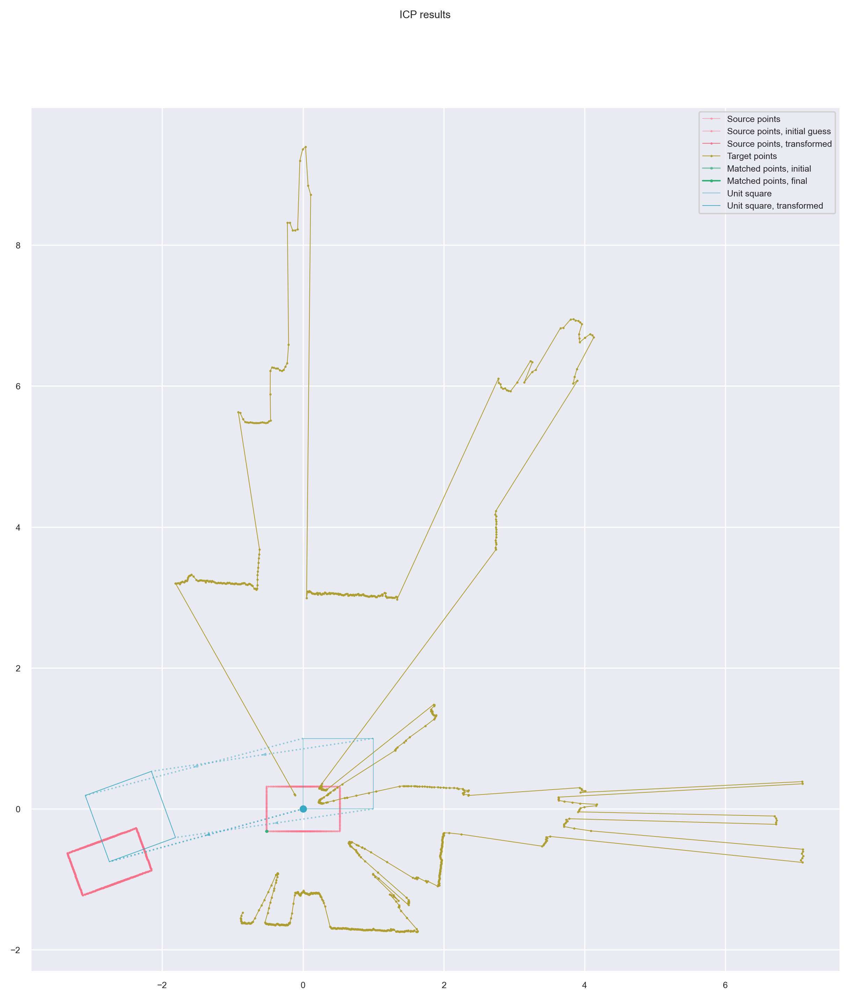

ic| e: ({0: 0,
         1: 1,
         2: 2,
         3: 3,
         4: 4,
         5: 5,
         6: 6,
         7: 7,
         8: 8,
         9: 9,
         10: 10,
         11: 11,
         12: 12,
         13: 13,
         14: 14},
        array([2.07528388, 4.93433889, 7.44468603, 0.27317092, 3.30572142,
              2.14886455, 2.58114702, 2.17815202, 4.50310947, 0.01226199,
              4.8702387 , 3.48975587, 3.86413838, 2.78445783, 4.08351617]))
ic| opn: array([ 1.5 , -2.5 ,  0.35])
    label: 9
    err[idx]: 0.012261990343929541
ic| 'Initial guess': 'Initial guess'
    init_tsf: array([[ 0.93937271, -0.34289781,  1.5       ],
                     [ 0.34289781,  0.93937271, -2.5       ],
                     [ 0.        ,  0.        ,  1.        ]])


2021-12-06 18:38:46| Getting errors for cluster #1... 
2021-12-06 18:38:46| Getting errors for cluster #2... 
2021-12-06 18:38:46| Getting errors for cluster #3... 
2021-12-06 18:38:46| Getting errors for cluster #4... 
2021-12-06 18:38:46| Getting errors for cluster #5... 
2021-12-06 18:38:46| Getting errors for cluster #6... 
2021-12-06 18:38:46| Getting errors for cluster #7... 
2021-12-06 18:38:46| Getting errors for cluster #8... 
2021-12-06 18:38:46| Getting errors for cluster #9... 
2021-12-06 18:38:46| Getting errors for cluster #10... 
2021-12-06 18:38:46| Getting errors for cluster #11... 
2021-12-06 18:38:46| Getting errors for cluster #12... 
2021-12-06 18:38:46| Getting errors for cluster #13... 
2021-12-06 18:38:46| Getting errors for cluster #14... 
2021-12-06 18:38:46| Getting errors for cluster #15... 


ic| tsf_: array([[-8.40081138e-01, -5.42460766e-01,  1.62747300e+18],
                 [-5.42460766e-01,  8.40081138e-01,  4.79783327e+17],
                 [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])
    tsl: array([1.62747300e+18, 4.79783327e+17])
    degrees(theta): 147.14868853423823


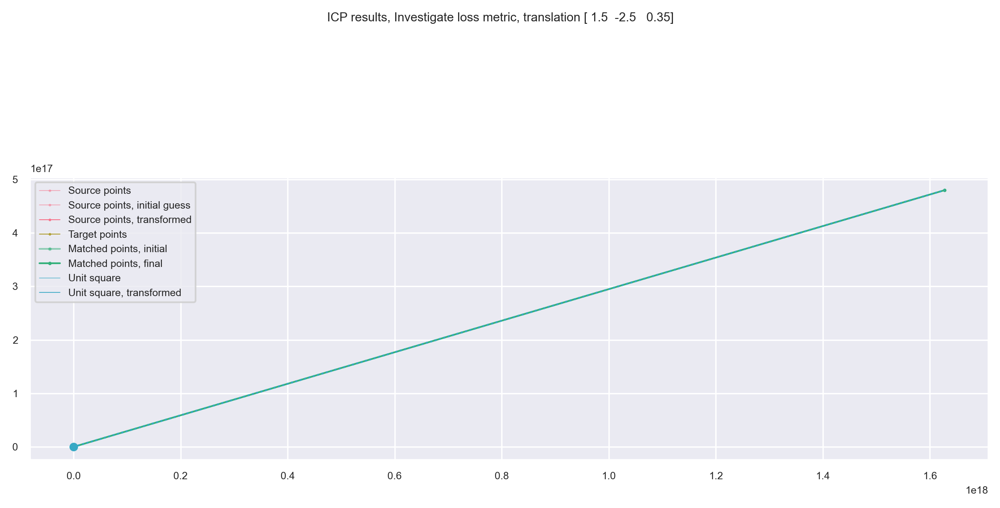

ic| tsf_: array([[ 0.93937271, -0.34289781,  1.5       ],
                 [ 0.34289781,  0.93937271, -2.5       ],
                 [ 0.        ,  0.        ,  1.        ]])
    tsl: array([ 1.5, -2.5])
    degrees(theta): 20.053522829578817


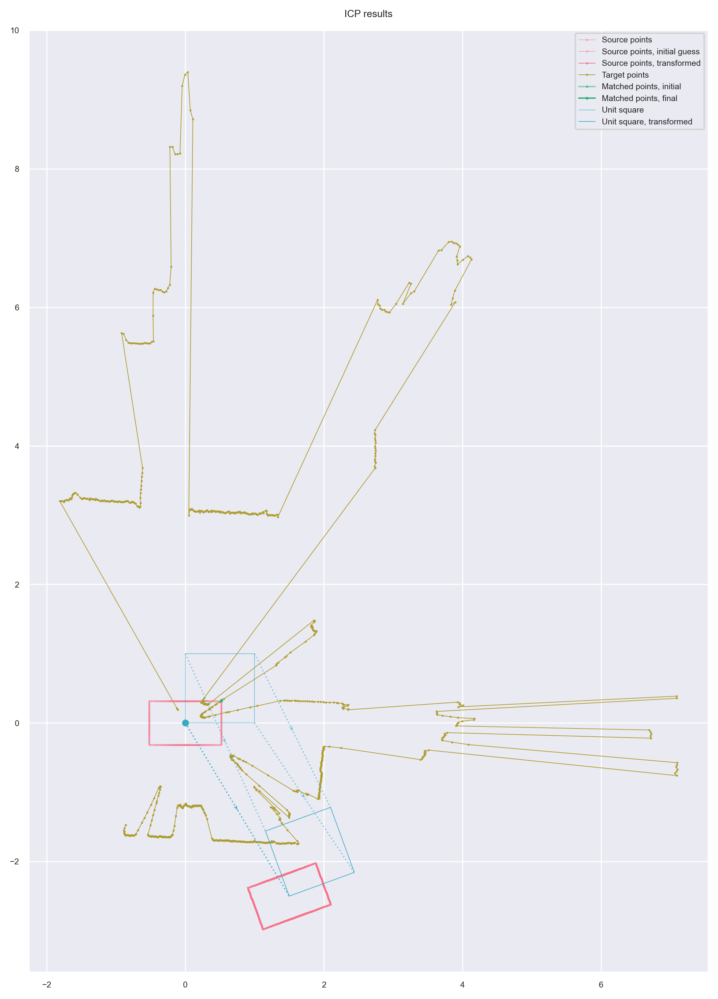

ic| e: ({0: 0,
         1: 1,
         2: 2,
         3: 3,
         4: 4,
         5: 5,
         6: 6,
         7: 7,
         8: 8,
         9: 9,
         10: 10,
         11: 11,
         12: 12,
         13: 13,
         14: 14},
        array([3.53208111, 5.35518961, 4.79494571, 2.97403582, 5.24392563,
              3.9460352 , 2.37881067, 1.74939851, 2.35573433, 1.00984519,
              2.6143339 , 3.00321746, 4.116778  , 0.01559353, 2.26925606]))
ic| opn: array([-0.25, -4.25,  0.7 ])
    label: 13
    err[idx]: 0.015593530168402028
ic| 'Initial guess': 'Initial guess'
    init_tsf: array([[ 0.76484219, -0.64421769, -0.25      ],
                     [ 0.64421769,  0.76484219, -4.25      ],
                     [ 0.        ,  0.        ,  1.        ]])
ic| tsf_: array([[ 0.76484219, -0.64421769, -0.2437148 ],
                 [ 0.64421769,  0.76484219, -4.26505511],
                 [ 0.        ,  0.        ,  1.        ]])
    tsl: array([-0.2437148 , -4.26505511])
    degree

2021-12-06 18:38:48| Getting errors for cluster #1... 
2021-12-06 18:38:48| Getting errors for cluster #2... 
2021-12-06 18:38:48| Getting errors for cluster #3... 
2021-12-06 18:38:48| Getting errors for cluster #4... 
2021-12-06 18:38:48| Getting errors for cluster #5... 
2021-12-06 18:38:48| Getting errors for cluster #6... 
2021-12-06 18:38:48| Getting errors for cluster #7... 
2021-12-06 18:38:48| Getting errors for cluster #8... 
2021-12-06 18:38:48| Getting errors for cluster #9... 
2021-12-06 18:38:48| Getting errors for cluster #10... 
2021-12-06 18:38:48| Getting errors for cluster #11... 
2021-12-06 18:38:48| Getting errors for cluster #12... 
2021-12-06 18:38:48| Getting errors for cluster #13... 
2021-12-06 18:38:48| Getting errors for cluster #14... 
2021-12-06 18:38:48| Getting errors for cluster #15... 


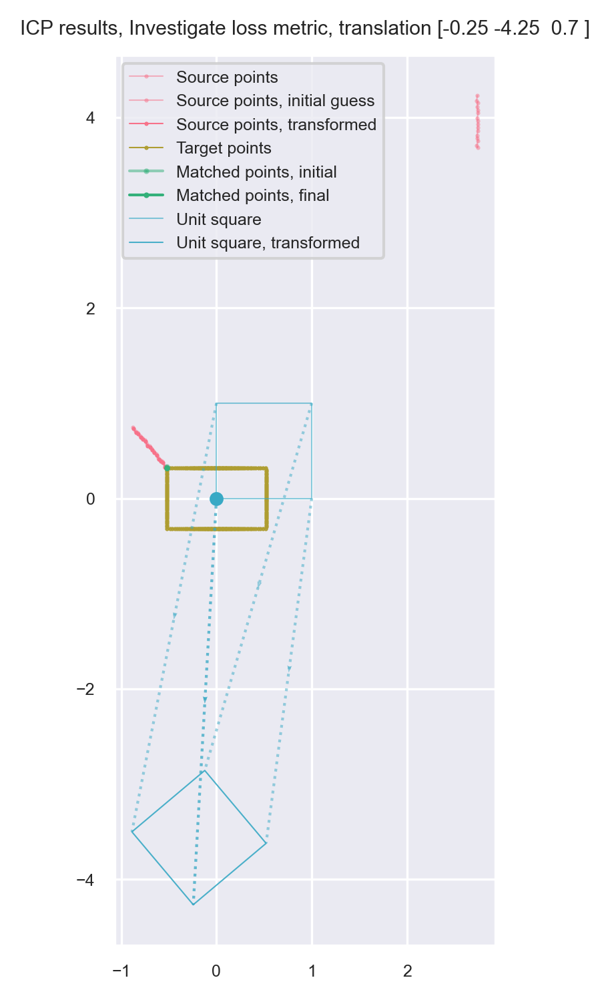

ic| tsf_: array([[ 0.76484219, -0.64421769, -0.25      ],
                 [ 0.64421769,  0.76484219, -4.25      ],
                 [ 0.        ,  0.        ,  1.        ]])
    tsl: array([-0.25, -4.25])
    degrees(theta): 40.10704565915763


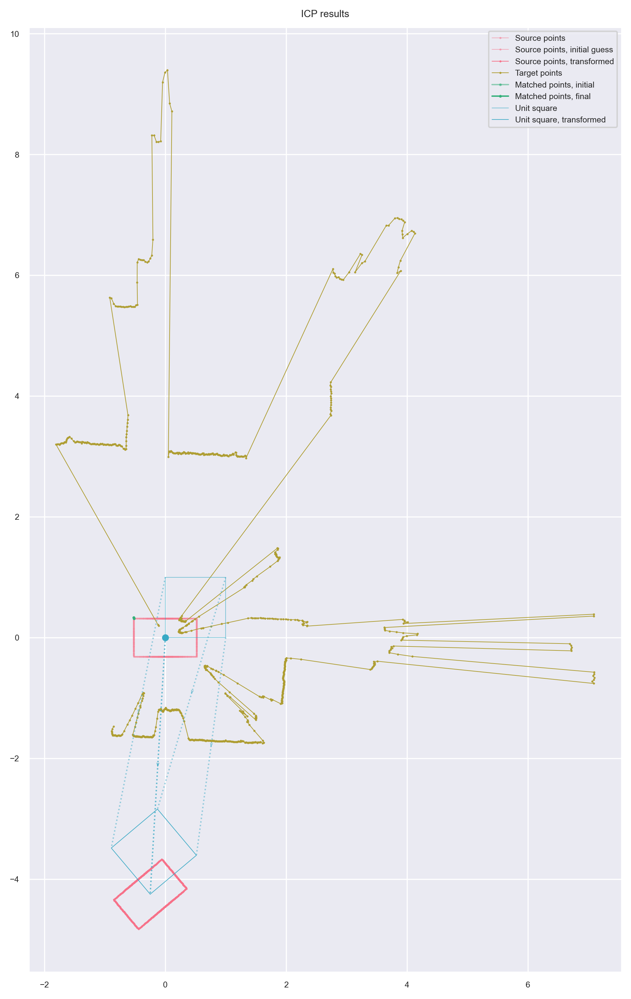

ic| e: ({0: 0,
         1: 1,
         2: 2,
         3: 3,
         4: 4,
         5: 5,
         6: 6,
         7: 7,
         8: 8,
         9: 9,
         10: 10,
         11: 11,
         12: 12,
         13: 13,
         14: 14},
        array([1.31621849, 9.32335838, 6.50916172, 4.2222641 , 0.19290469,
              6.58447796, 2.3325842 , 3.19254958, 3.22967757, 4.13417499,
              8.34588206, 1.38026104, 0.01853138, 5.76898802, 7.80929816]))
ic| opn: array([-0.75,  1.5 ,  0.6 ])
    label: 12
    err[idx]: 0.018531376797777395
ic| 'Initial guess': 'Initial guess'
    init_tsf: array([[ 0.82533561, -0.56464247, -0.75      ],
                     [ 0.56464247,  0.82533561,  1.5       ],
                     [ 0.        ,  0.        ,  1.        ]])


2021-12-06 18:38:50| Getting errors for cluster #1... 
2021-12-06 18:38:50| Getting errors for cluster #2... 
2021-12-06 18:38:50| Getting errors for cluster #3... 
2021-12-06 18:38:50| Getting errors for cluster #4... 
2021-12-06 18:38:50| Getting errors for cluster #5... 
2021-12-06 18:38:50| Getting errors for cluster #6... 
2021-12-06 18:38:50| Getting errors for cluster #7... 
2021-12-06 18:38:50| Getting errors for cluster #8... 
2021-12-06 18:38:50| Getting errors for cluster #9... 
2021-12-06 18:38:50| Getting errors for cluster #10... 
2021-12-06 18:38:50| Getting errors for cluster #11... 
2021-12-06 18:38:50| Getting errors for cluster #12... 
2021-12-06 18:38:50| Getting errors for cluster #13... 
2021-12-06 18:38:50| Getting errors for cluster #14... 
2021-12-06 18:38:50| Getting errors for cluster #15... 


ic| tsf_: array([[ 9.38805534e-01,  3.44447630e-01, -5.75218830e+25],
                 [ 3.44447630e-01, -9.38805534e-01,  3.23775620e+26],
                 [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])
    tsl: array([-5.7521883e+25,  3.2377562e+26])
    degrees(theta): 20.14808070603905


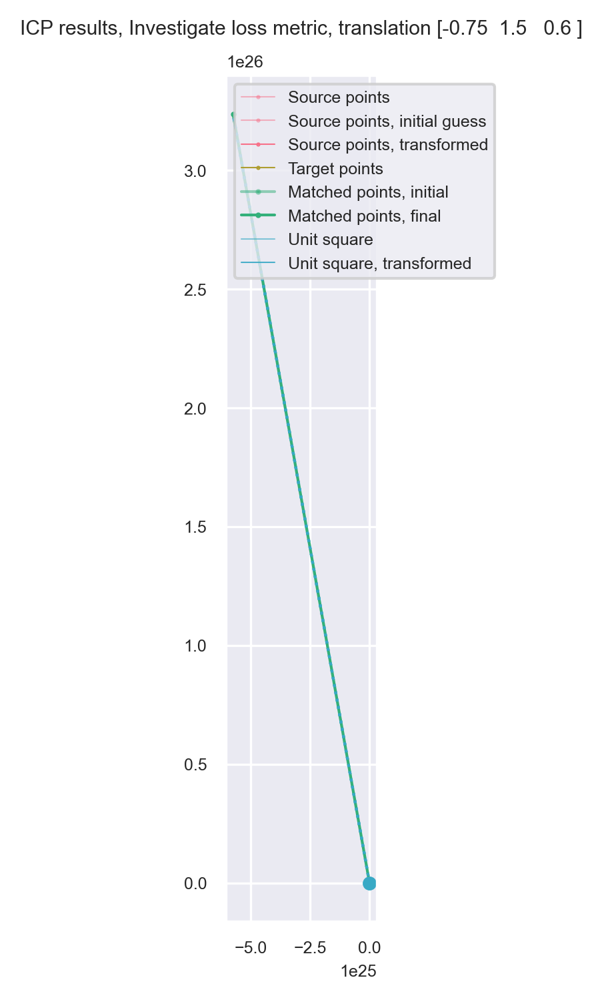

ic| tsf_: array([[ 0.82533561, -0.56464247, -0.75      ],
                 [ 0.56464247,  0.82533561,  1.5       ],
                 [ 0.        ,  0.        ,  1.        ]])
    tsl: array([-0.75,  1.5 ])
    degrees(theta): 34.377467707849405


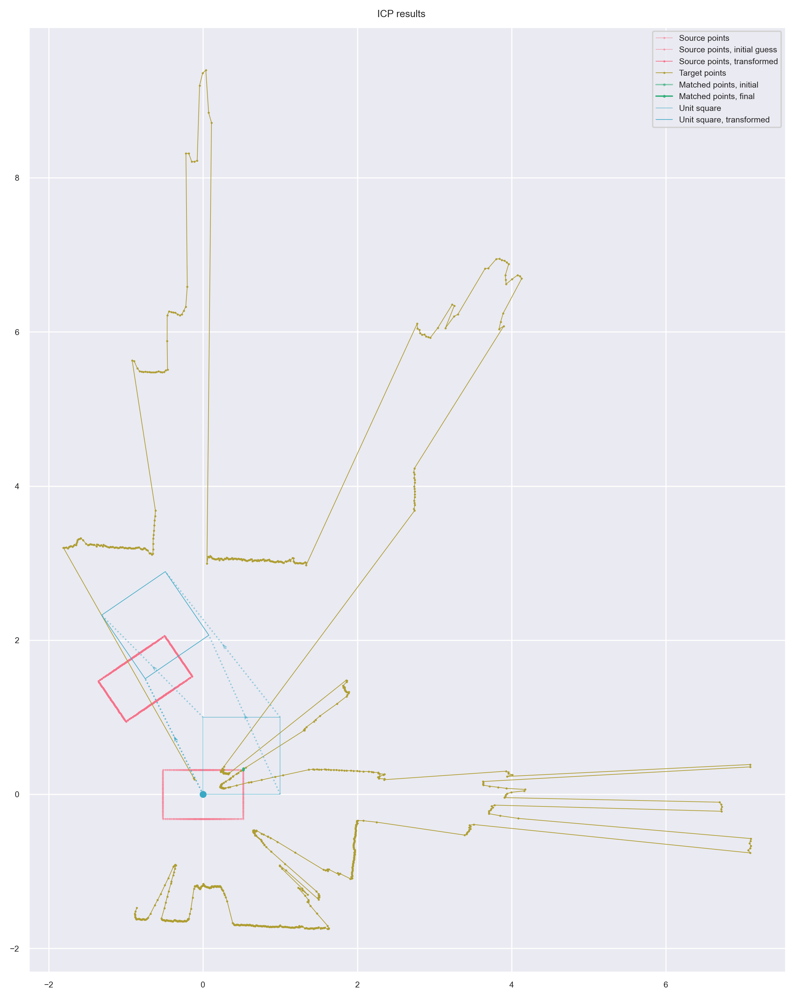

ic| e: ({0: 0,
         1: 1,
         2: 2,
         3: 3,
         4: 4,
         5: 5,
         6: 6,
         7: 7,
         8: 8,
         9: 9,
         10: 10,
         11: 11,
         12: 12,
         13: 13,
         14: 14},
        array([3.2825105 , 5.28465642, 4.29772778, 3.23887267, 4.93699026,
              3.65600422, 2.87838697, 1.81424658, 2.60467126, 1.26240481,
              3.15784285, 3.97481039, 4.86738011, 0.00668921, 2.18015727]))
ic| opn: array([-2.25, -4.  ,  0.25])
    label: 13
    err[idx]: 0.020067638104268534
ic| 'Initial guess': 'Initial guess'
    init_tsf: array([[ 0.96891242, -0.24740396, -2.25      ],
                     [ 0.24740396,  0.96891242, -4.        ],
                     [ 0.        ,  0.        ,  1.        ]])
ic| tsf_: array([[ 9.60818023e-01,  2.77179953e-01,  2.12960006e+28],
                 [ 2.77179953e-01, -9.60818023e-01, -1.50651522e+29],
                 [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]])
    tsl: array([ 

2021-12-06 18:38:52| Getting errors for cluster #1... 
2021-12-06 18:38:52| Getting errors for cluster #2... 
2021-12-06 18:38:52| Getting errors for cluster #3... 
2021-12-06 18:38:52| Getting errors for cluster #4... 
2021-12-06 18:38:52| Getting errors for cluster #5... 
2021-12-06 18:38:52| Getting errors for cluster #6... 
2021-12-06 18:38:52| Getting errors for cluster #7... 
2021-12-06 18:38:52| Getting errors for cluster #8... 
2021-12-06 18:38:52| Getting errors for cluster #9... 
2021-12-06 18:38:52| Getting errors for cluster #10... 
2021-12-06 18:38:52| Getting errors for cluster #11... 
2021-12-06 18:38:52| Getting errors for cluster #12... 
2021-12-06 18:38:52| Getting errors for cluster #13... 
2021-12-06 18:38:52| Getting errors for cluster #14... 
2021-12-06 18:38:52| Getting errors for cluster #15... 


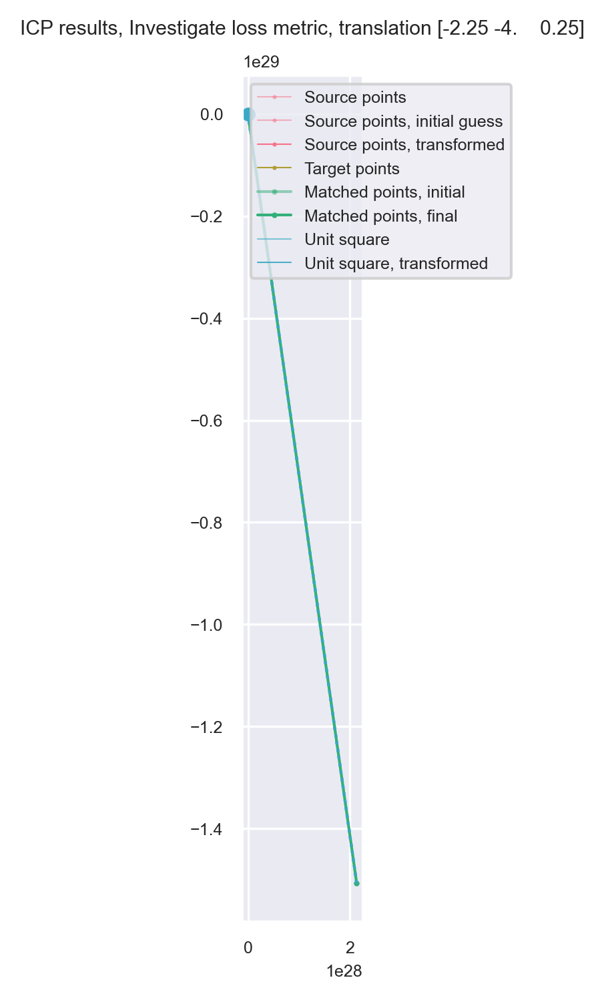

ic| tsf_: array([[ 0.96891242, -0.24740396, -2.25      ],
                 [ 0.24740396,  0.96891242, -4.        ],
                 [ 0.        ,  0.        ,  1.        ]])
    tsl: array([-2.25, -4.  ])
    degrees(theta): 14.323944878270593


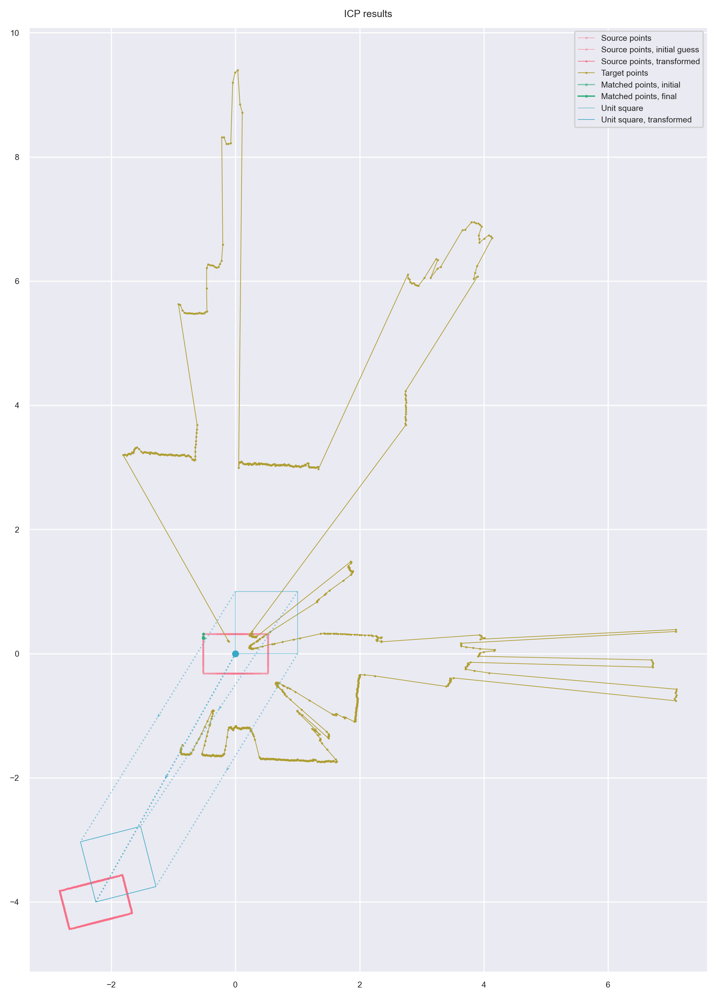

ic| 1188340111.py:45 in <module> at 18:38:54.503
ic| opn: array([-1.5,  5. ,  0.9])
    label_idxs[idx]: 7
    err[idx]: 6.277792659983108
ic| opn: array([-1.75,  5.  ,  0.85])
    label_idxs[idx]: 7
    err[idx]: 6.293185121806874
ic| opn: array([-1.5 ,  5.  ,  0.95])
    label_idxs[idx]: 7
    err[idx]: 6.294289364037097
ic| opn: array([-1.5,  5. ,  1. ])
    label_idxs[idx]: 7
    err[idx]: 6.307904727757379
ic| opn: array([-1.75,  5.  ,  0.9 ])
    label_idxs[idx]: 7
    err[idx]: 6.315479571357446


In [5]:
fnm = os.path.join(
    PATH_BASE, DIR_PROJ,
    'gird-search, [(-5, 5), (-5, 5), 0.25], [(0, 1), 0.05], 2021-12-06 17:41:30.pickle'
)

def check(opn, pts):
    init_tsf = tsl_n_angle2tsf(opn)
    tsf, states = visualize(
        pts, pcr_kuka,
        title=f'Investigate loss metric, translation {opn}',
        init_tsf=init_tsf,
    )
    # Plot the 1st iteration only
    tsf_rev = np.linalg.inv(tsf)  # Looks like this works
    states = states[:1]
    plot_icp_result(pcr_kuka, pts_hsr, tsf_rev, states=states, init_tsf=init_tsf)


with open(fnm, 'rb') as handle:
    d = pickle.load(handle)
    opns_x = d['options_x']
    opns_y = d['options_y']
    opns_ang = d['options_angle']
    errs = d['errors']
    label_idxs = d['label_indices']
    clusters = [pts_hsr[np.where(lbs == lb)] for lb in label_idxs]

    ic(label_idxs)
    opns = cartesian([opns_x, opns_y, opns_ang])
    ic(opns.shape, errs.shape)
    idxs_sort = np.argsort(errs.min(axis=-1))
    ic(idxs_sort.shape, idxs_sort[:20])
    opns = opns[idxs_sort]
    errs = errs[idxs_sort]
    n = 5
    for opn, err in zip(opns[:n], errs[:n]):
        e = Loss(pcr_kuka).pose_error(pts_hsr, opn, labels=lbs)
        ic(e)
        exit(1)
        idx = np.argmin(err)
        label = label_idxs[idx]
        ic(opn, label, err[idx])

        check(opn, clusters[label])
    ic()
    for opn, err in zip(opns[-n:], errs[-n:]):
        idx = np.argmin(err)
        ic(opn, label_idxs[idx], err[idx])

